# Image Segmentation

## Mount google drive

and prepare some output folders

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! mkdir /content/drive/MyDrive/imageSegmentation

## Download and unzip the data

In [ ]:
! wget http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz

--2022-11-14 09:30:35--  http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www.eecs.berkeley.edu (www.eecs.berkeley.edu)... 23.185.0.1, 2620:12a:8001::1, 2620:12a:8000::1
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2022-11-14 09:30:35--  https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2022-11-14 09:30:35--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www2.eecs.berkeley.edu (ww

In [ ]:
! mkdir drive/MyDrive/imageSegmentation/datasets

In [ ]:
! mv BSR_bsds500.tgz drive/MyDrive/imageSegmentation/datasets

In [ ]:
! tar -xvzf drive/MyDrive/imageSegmentation/datasets/BSR_bsds500.tgz -C drive/MyDrive/imageSegmentation/datasets/

BSR/
BSR/documentation/
BSR/documentation/Arbelaez_Maire_Fowlkes_Malik_TPAMI2010.pdf
BSR/bench/
BSR/bench/source/
BSR/bench/source/match.hh
BSR/bench/source/Matrix.cc
BSR/bench/source/Timer.cc
BSR/bench/source/csa_types.h
BSR/bench/source/csa.cc
BSR/bench/source/correspondPixels.cc
BSR/bench/source/build.sh
BSR/bench/source/match.cc
BSR/bench/source/Sort.hh
BSR/bench/source/csa_defs.h
BSR/bench/source/Timer.hh
BSR/bench/source/Exception.cc
BSR/bench/source/String.cc
BSR/bench/source/Array.hh
BSR/bench/source/kofn.hh
BSR/bench/source/Random.hh
BSR/bench/source/Exception.hh
BSR/bench/source/.gitignore
BSR/bench/source/kofn.cc
BSR/bench/source/build.m
BSR/bench/source/Random.cc
BSR/bench/source/Point.hh
BSR/bench/source/README
BSR/bench/source/Matrix.hh
BSR/bench/source/csa.hh
BSR/bench/source/String.hh
BSR/bench/bench_bsds500.m
BSR/bench/data/
BSR/bench/data/groundTruth/
BSR/bench/data/groundTruth/6046.mat
BSR/bench/data/groundTruth/2018.mat
BSR/bench/data/groundTruth/8068.mat
BSR/bench/

Data is unzipped and available at [This link](https://drive.google.com/drive/folders/1-27fqQjJBTlMxrIBzmKzgfhcXkv0rAJl)

Please add this a shortcut to your google drive under a folder called `datasets` to be able to run this notebook.

## Imports

In [ ]:
import numpy              as np
import pandas as pd
import matplotlib.pyplot  as plt

import cv2
import os

from sklearn import metrics

from scipy.io import loadmat

## Constants

In [ ]:
IN = '/content/drive/MyDrive/imageSegmentation/datasets/BSR/BSDS500/data'
OUT = '/content/drive/MyDrive/colab-outputs/img-segmentation/out'

## Exploring Data

Folder tree
```
IN
|_Images
| |_val
| | |_ ....jpg
| | |_ Thumbs.db
| |_train
| | |_ ....jpg
| | |_ Thumbs.db
| |_test
|   |_ ....jpg
|   |_ Thumbs.db
|
|_groundTruth
  |_val
  | |_ ....mat
  |_train
  | |_ ....mat
  |_test
    |_ ....mat
```

(321, 481, 3)


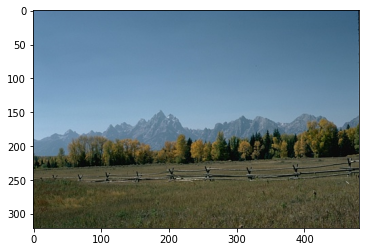

In [ ]:
img = cv2.imread(f'{IN}/images/train/2092.jpg')
plt.imshow(img[:,:,::-1])

print(img.shape)
plt.show()

## Data loaders

In [ ]:
def get_img_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  images = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'jpg':
      continue

    images.append(cv2.imread(f'{input_folder}/{file}'))
  return images

def get_ground_truth_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  data = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'mat':
      continue

    data.append(loadmat(f'{input_folder}/{file}'))
  return data

In [ ]:
x_test = get_img_data(f'{IN}/images/test',subset = 50)
y_test = get_ground_truth_data(f'{IN}/groundTruth/test', subset = 50)

print("test samples: ",len(x_test), len(y_test))

test samples:  50 50


In [ ]:
x_test[0]

array([[[ 73,  73,  55],
        [ 74,  74,  56],
        [ 75,  75,  57],
        ...,
        [ 29,  37,  27],
        [ 24,  32,  22],
        [ 27,  31,  25]],

       [[ 69,  69,  51],
        [ 71,  71,  53],
        [ 73,  73,  55],
        ...,
        [ 32,  38,  27],
        [ 27,  32,  23],
        [ 27,  32,  23]],

       [[ 73,  71,  53],
        [ 76,  74,  56],
        [ 80,  78,  60],
        ...,
        [ 45,  48,  33],
        [ 31,  33,  21],
        [ 29,  32,  23]],

       ...,

       [[151, 147, 153],
        [148, 146, 152],
        [147, 143, 149],
        ...,
        [ 46,  52,  51],
        [ 41,  50,  47],
        [ 40,  47,  44]],

       [[184, 180, 186],
        [188, 186, 192],
        [188, 184, 190],
        ...,
        [ 45,  53,  52],
        [ 40,  48,  47],
        [ 39,  46,  43]],

       [[171, 164, 171],
        [168, 164, 170],
        [165, 158, 165],
        ...,
        [ 45,  53,  53],
        [ 38,  49,  47],
        [ 35,  44,  41]]

## Display image and ground truth

In [ ]:
def disp_img_truth(img,truth,edges=True):
  fig = plt.figure(figsize=(30,10))
  n = len(truth['groundTruth'][0])
  ax_img = fig.add_subplot(1,n+1,1)
  ax_img.imshow(img[:,:,::-1])
  ax_img.axis('off')

  ax_gt = []
  for i,gt in enumerate(truth['groundTruth'][0]):
    ax_gt.append(fig.add_subplot(1,n+1,i+2))
    if edges:
      ground_truth = gt[0][0][1]
      ax_gt[-1].imshow(-1*ground_truth.astype(np.uint8),cmap='gray')
    else:
      ground_truth = gt[0][0][0]
      ax_gt[-1].imshow(ground_truth.astype(np.uint8))
    ax_gt[-1].axis('off')
    
  plt.show()

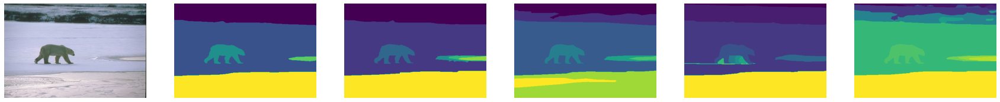

In [ ]:
disp_img_truth(x_test[0],y_test[0],edges=False)

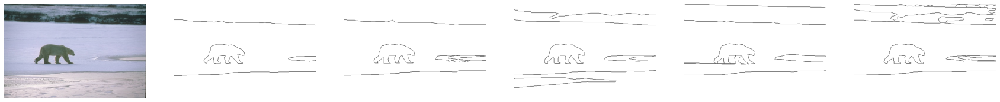

In [ ]:
disp_img_truth(x_test[0],y_test[0],edges=True)

## Trying built in methods for clustering

In [ ]:
def encode_position(img):
  img_indices = np.zeros((img.shape[:-1]+(5,)))
  img_indices[:,:,:3] = img

  row,col = np.indices((img.shape[:2]))
  img_indices[:,:,3] = row / img.shape[0]
  img_indices[:,:,4] = col / img.shape[1]

  return img_indices

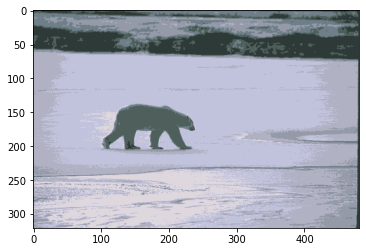

In [ ]:
img = x_test[0]

def k_means_cv(k, img):
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85)
  retval, labels, centers = cv2.kmeans(np.float32(img.reshape((-1,img.shape[-1]))), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  
  # convert data into 8-bit values
  centers = np.uint8(centers)
  segmented_data = centers[labels.flatten()]
    
  # reshape data into the original image dimensions
  return segmented_data.reshape((img.shape))

plt.imshow(k_means_cv(7,img)[:,:,::-1])

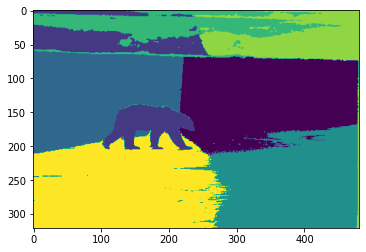

In [ ]:
from sklearn.cluster import KMeans
def k_means_sk(k, img):  
  labels = KMeans(k).fit_predict(img.reshape(-1,img.shape[-1]))

  # reshape data into the original image dimensions
  return labels.reshape((img.shape[:2]))

plt.imshow(k_means_sk(7,encode_position(img /255.)))

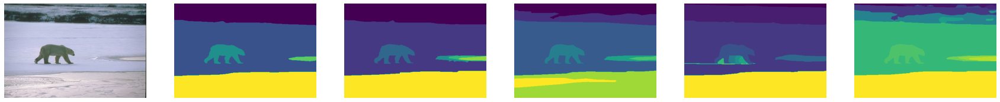

In [ ]:
disp_img_truth(x_test[0],y_test[0],edges=False)

## Segmentation Using K-Means

In [ ]:
class K_Means:
  def __init__(self,k=3):
    self.k = k
    self.centroids = None
    self.labels = None

  def fit(self,x_train, max_iter=100):
    # put the data in the right format
    if x_train.ndim != 2:
      x_train = x_train.reshape((-1,x_train.shape[-1]))

    # initialize the centroids
    self.centroids = np.random.choice(x_train.shape[0],self.k,replace=False)
    self.centroids = x_train[self.centroids]

    it = 0
    while it < max_iter:
      it += 1
      # calculate the distance between each point and each centroid
      dist = np.linalg.norm(x_train[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
      # assign each point to the closest centroid
      self.labels = np.argmin(dist,axis=-1)
      # calculate the new centroids
      new_centroids = np.zeros_like(self.centroids)
      for i in range(self.k):
        # calculate the mean of all points assigned to the centroid
        new_centroids[i] = np.mean(x_train[self.labels==i],axis=0)
      # check the stopping condition
      if np.all(new_centroids == self.centroids):
        break
      self.centroids = new_centroids

  def predict(self,x_test):
    # put the data in the right format
    if x_test.ndim != 2:
      x_test = x_test.reshape((-1,x_test.shape[-1]))

    # calculate the distance between each point and each centroid
    dist = np.linalg.norm(x_test[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
    # assign each point to the closest centroid
    return np.argmin(dist,axis=-1)


In [ ]:
def k_means(k, img, position = False):
  fitted = K_Means(k)
  img = encode_position(img/255.) if position else (img / 255.)
  fitted.fit(img)
  labels = fitted.predict(img)

  return labels.reshape(img.shape[:2])

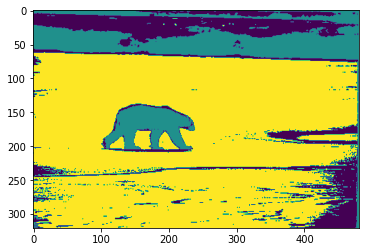

In [ ]:
plt.imshow(k_means(3,x_test[0]))

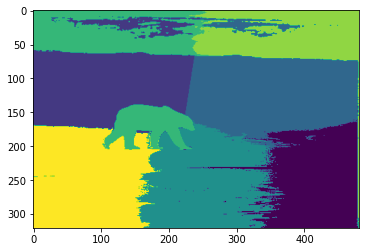

In [ ]:
plt.imshow(k_means(7,x_test[0],position = True))

### Trying different Ks and saving as colored images

In [ ]:
def get_all_labels(X, n = [3,5,7,9,11], position = False):
  y_pred = []
  for x in X:
    y = []
    for k in n:
      y.append(k_means(k,x,position = position))
    y_pred.append(y)
  return y_pred  

In [ ]:
y_pred = get_all_labels(x_test)

KeyboardInterrupt: ignored

In [ ]:
def save_all_labels(y_pred,dir):
  for i in range(len(y_pred)):
    path = f'{dir}/{i}'
    # os.mkdir(path)
    for j,y in enumerate(y_pred[i]):
      y = 255. * y / max(np.max(y),1)
      cv2.imwrite(f'{path}/{j}.png',y)

  

In [ ]:
#! mkdir /content/drive/MyDrive/colab-outputs/img-segmentation/out/test

In [ ]:
# save_all_labels(y_pred, f'{OUT}/test')

In [ ]:
# np.save(f'{OUT}/test/y_pred',np.array(y_pred,dtype=object))

In [ ]:
y_loaded = np.load(f'{OUT}/test/y_pred.npy',allow_pickle=True)
# y_loaded

###big picture

kmean of image 0


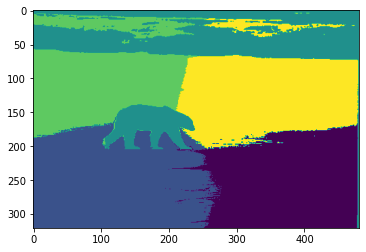

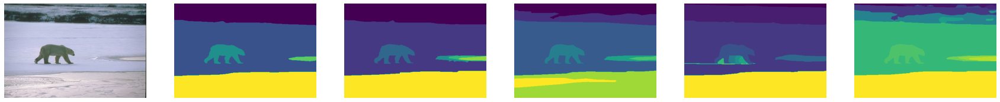

ground truth of image 0
kmean of image 1


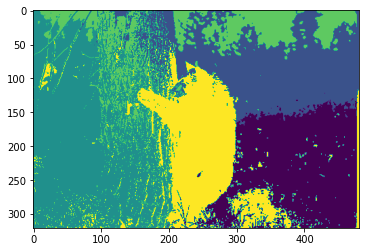

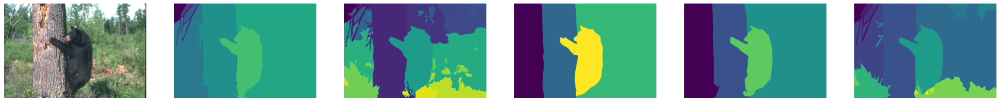

ground truth of image 1
kmean of image 2


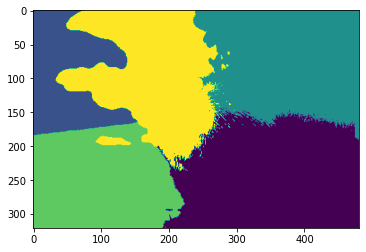

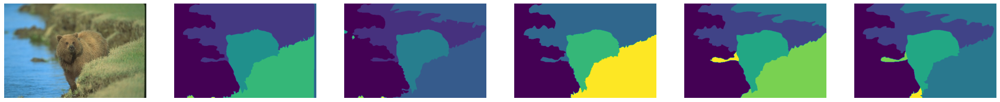

ground truth of image 2
kmean of image 3


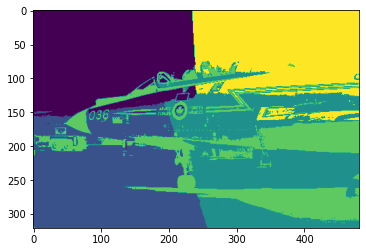

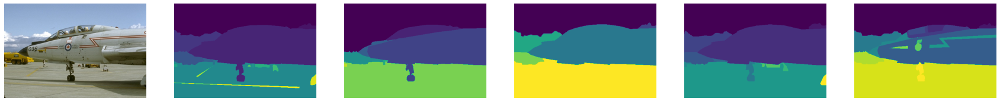

ground truth of image 3
kmean of image 4


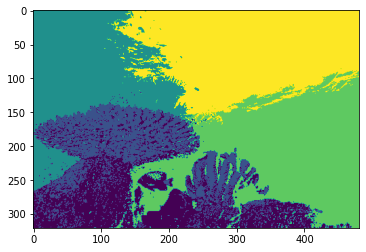

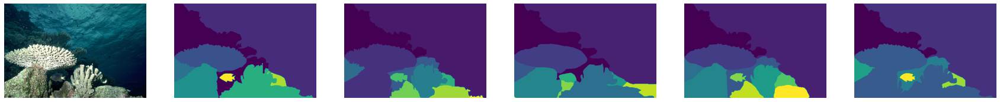

ground truth of image 4


In [ ]:
for i in range(0,5):
 plt.imshow(k_means(5,x_test[i],position = True))
 print("kmean of image "+str(i))
 disp_img_truth(x_test[i],y_test[i],edges=False)
 print("ground truth of image "+str(i))

a)the model can differentiate better when the image has less features and more contrast between the colors ,also in plane image since it has more details the model couldn't differentiate it as an object but it recognized some details and edges.

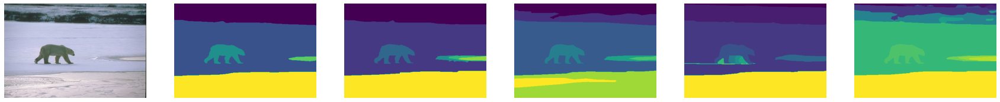

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


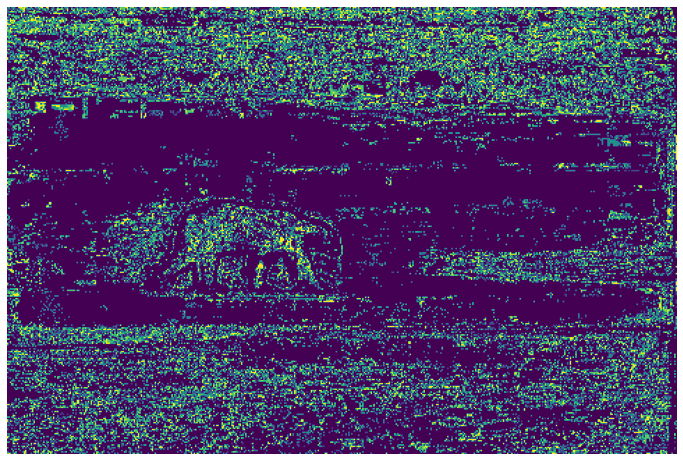

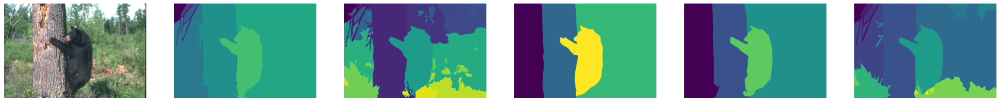

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


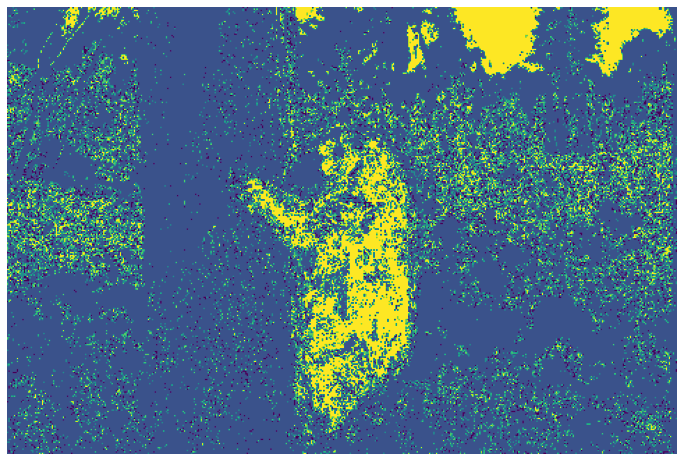

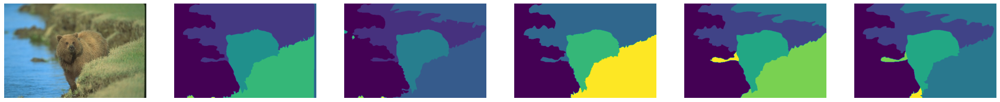

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


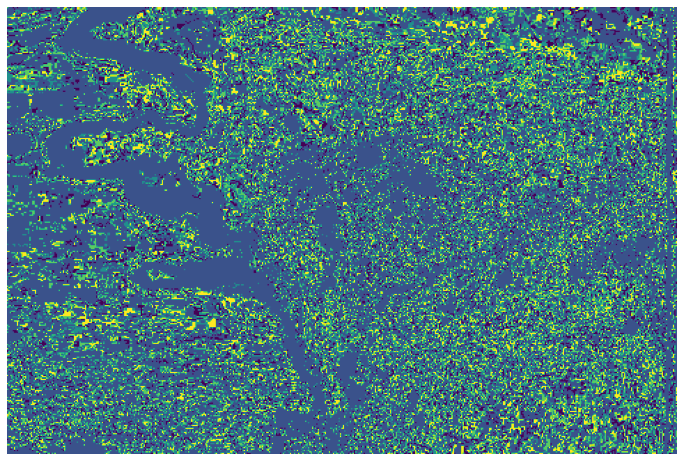

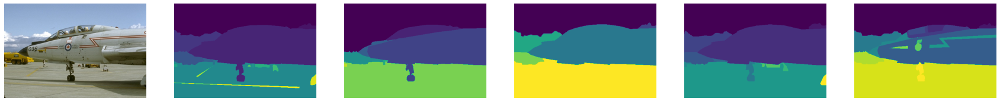

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


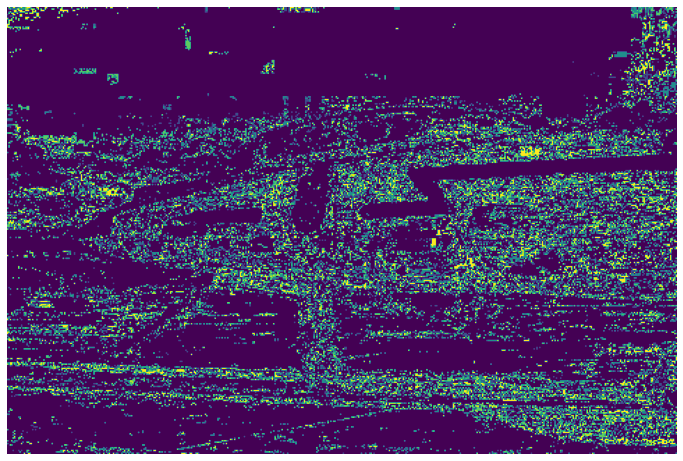

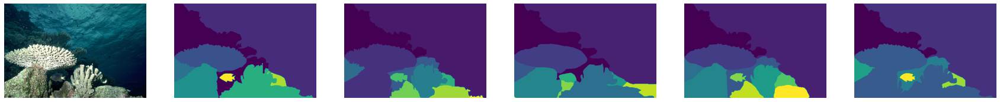

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


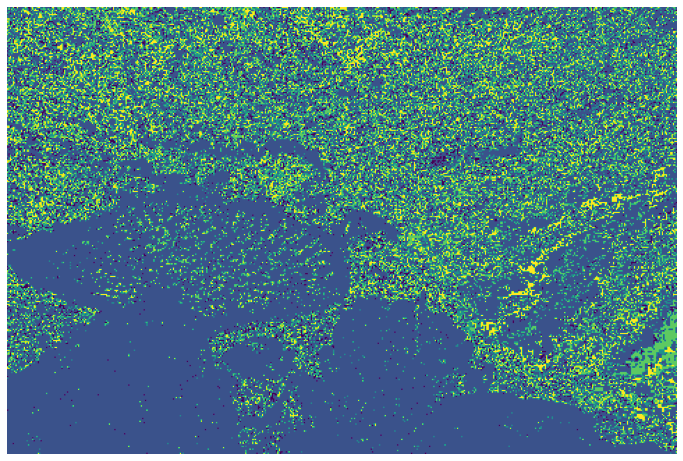

In [ ]:
from sklearn.cluster import SpectralClustering
from skimage.transform import resize
import scipy

for i in range(0,5):
  disp_img_truth(x_test[i],y_test[i],edges=False)
  img=x_test[i]/255
  n = img.shape[0]
  m = img.shape[1]
  img = img.reshape(-1, img.shape[-1])
  labels = SpectralClustering(n_clusters=5,
                                affinity='nearest_neighbors',
                                gamma=1,
                                n_neighbors=5,
                                n_jobs=5
                                eigen_solver='amg'
                                ).fit_predict(img)
  labels = labels.reshape(n,m)


  plt.figure(figsize=(12, 12))
  plt.axis('off')
  plt.imshow(labels)

b)normalized cut generates bad results when features have similar colors or blended in

In [ ]:
from sklearn.cluster import SpectralClustering
from skimage.transform import resize
import scipy
def Ncut(img):
    n = img.shape[0]
    m = img.shape[1]
    img = img.reshape(-1, img.shape[-1])
    labels = SpectralClustering(n_clusters=5,
                                  affinity='nearest_neighbors',
                                  gamma=1,
                                  n_neighbors=5,
                                  eigen_solver='amg',n_components=None
                                  ).fit_predict(img)
    labels = labels.reshape(n,m)


    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(labels)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expecte

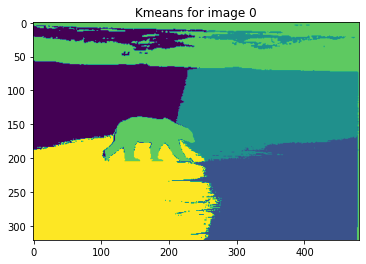

<Figure size 432x288 with 0 Axes>

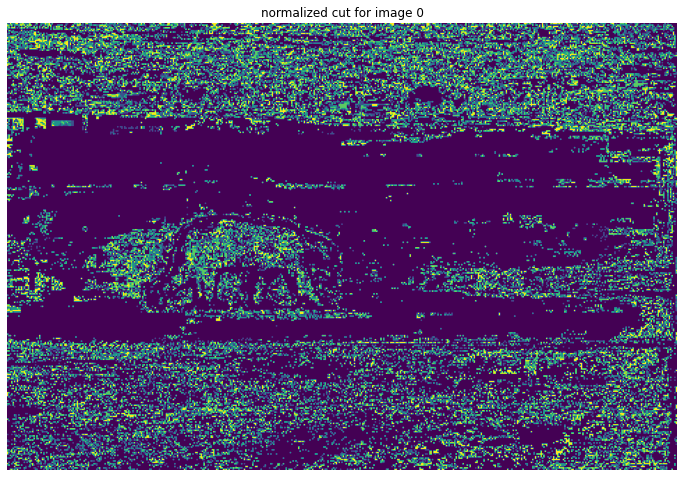

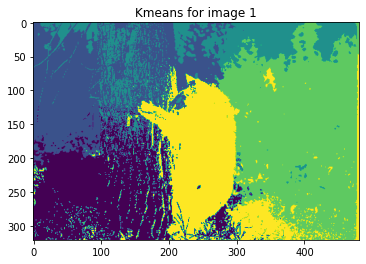

<Figure size 432x288 with 0 Axes>

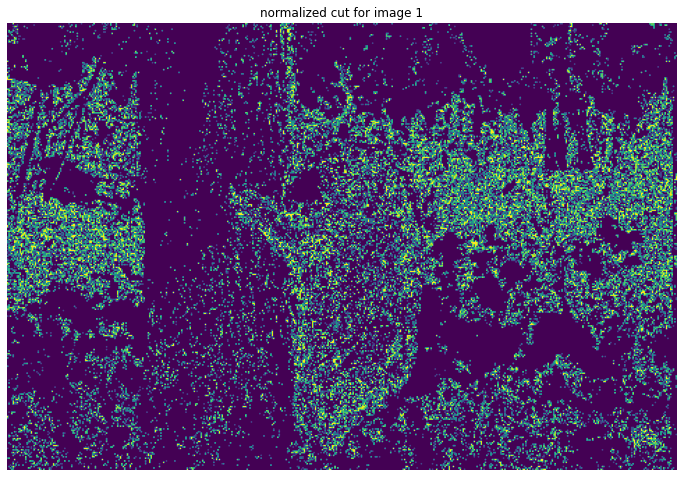

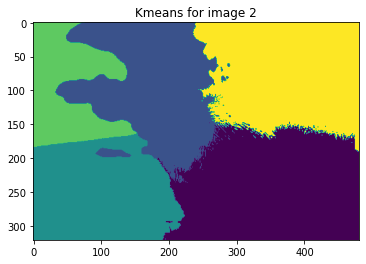

<Figure size 432x288 with 0 Axes>

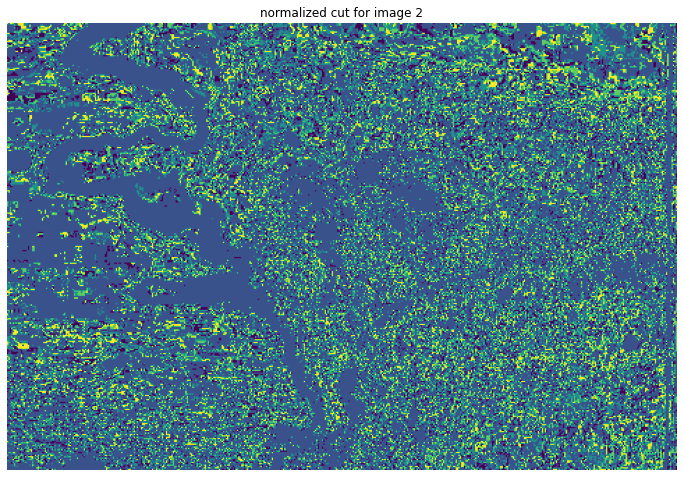

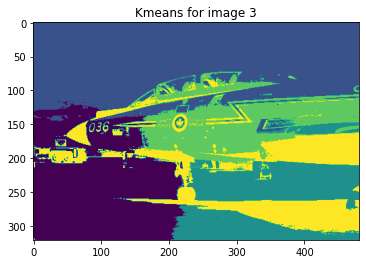

<Figure size 432x288 with 0 Axes>

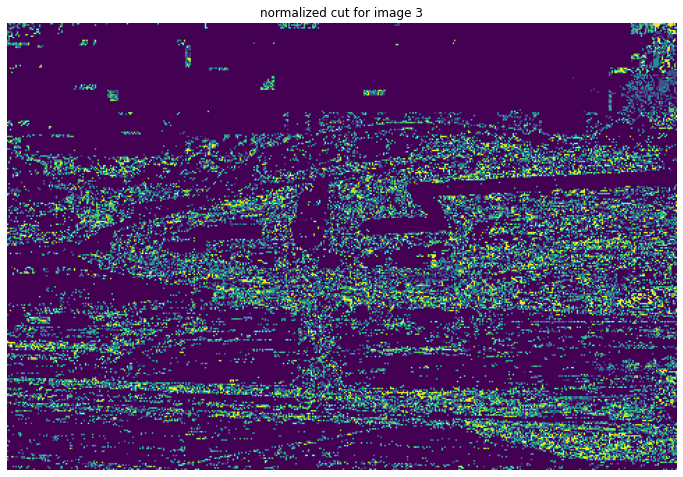

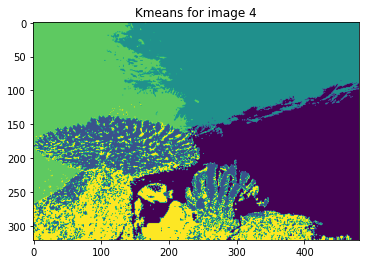

<Figure size 432x288 with 0 Axes>

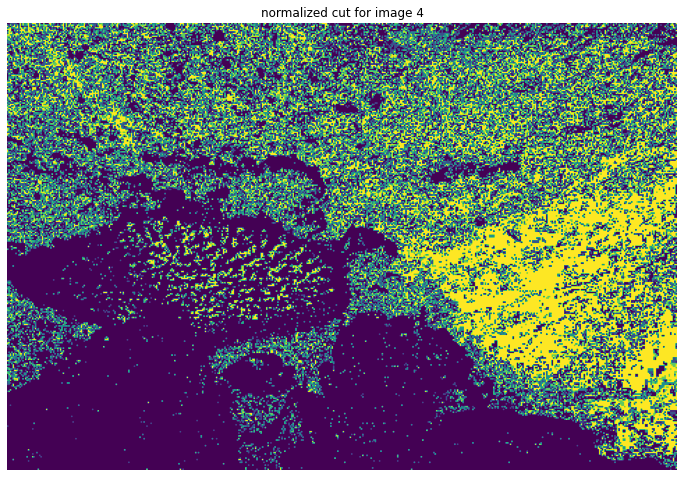

<Figure size 432x288 with 0 Axes>

In [ ]:
for i in range(0,5):
  plt.imshow(k_means(5,x_test[i],position = True))
  plt.title("Kmeans for image "+str(i))
  plt.figure()
  t=x_test[i]/255
  Ncut(t)
  plt.title("normalized cut for image "+str(i))
  plt.figure()


c)kmeans is better than normalized cut in image segmentation


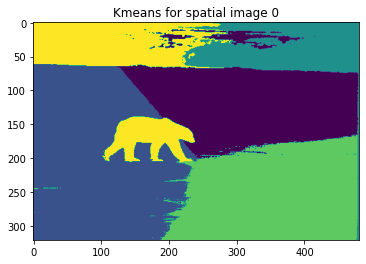

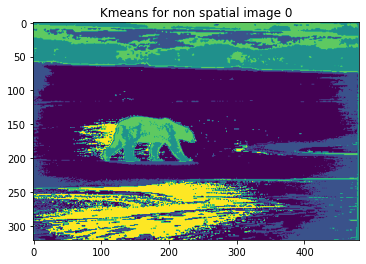

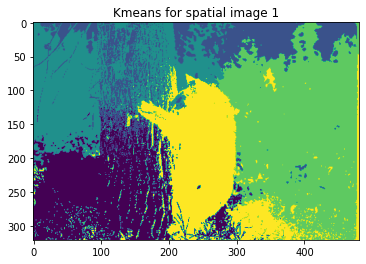

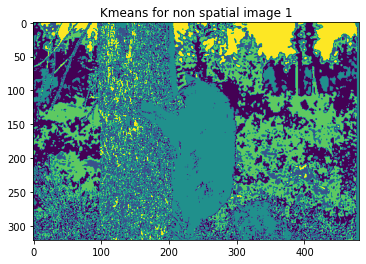

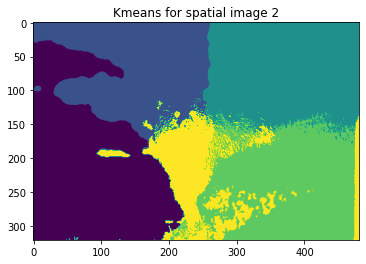

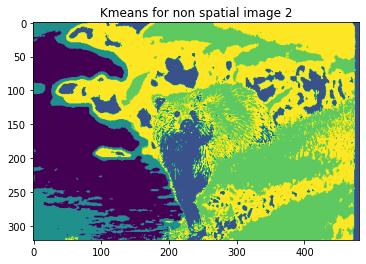

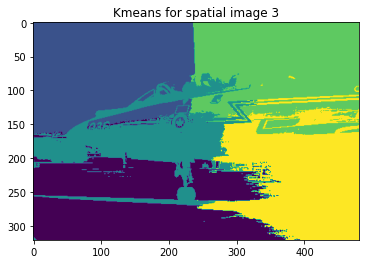

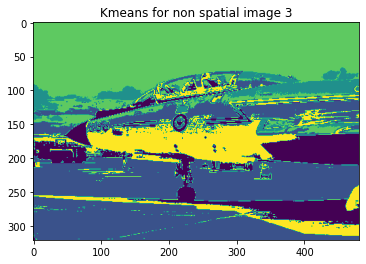

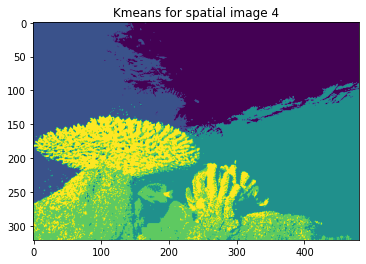

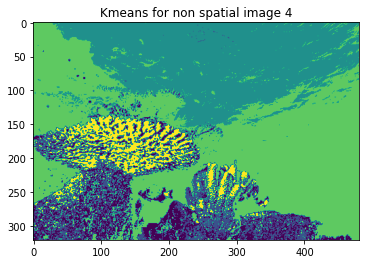

<Figure size 432x288 with 0 Axes>

In [ ]:
for i in range(0,5):
 plt.imshow(k_means(5,x_test[i],position = True))
 plt.title("Kmeans for spatial image "+str(i))
 plt.figure()
 plt.imshow(k_means(5,x_test[i],position = False))
 plt.title("Kmeans for non spatial image "+str(i))
 plt.figure()
 